# Import des Librairies

In [45]:
import cv2 as cv2 # librairie OpenCV gère les valeurs des pixels non pas dans l’ordre RVB, mais à l’inverse dans l’ordre BVR
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial.distance import cosine as dcos
from scipy.io import loadmat

In [46]:
# Keras: bibliothèque open source qui permet notamment de concevoir des services web et développer de nouveaux systèmes d'intelligence artificielle (IA). 
# Dans un process de deep learning, création des réseaux de neurones artificiels.
from keras.models import Sequential, Model
from keras.layers import Flatten, Dropout, Activation, Permute
from keras.layers import Convolution2D, MaxPooling2D 
from keras import backend as K
K.set_image_data_format( 'channels_last' )

In [47]:
import os # librairie os pour aller lire le contenu des répertoires et charger les images
import sys # Paramètres et fonctions propres à des systèmes Le module sys fournit des fonctions et des variables qui permettent d’interagir avec l’interpréteur Python.

# Imports d'images

In [54]:
# Elizabeth
listeImages = os.listdir("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/ElizabethII/.")
listeImages = np.asarray(listeImages) #conversion en array
listeImages #affichage

# Meryll
listeImagesMS = os.listdir("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/meryl strip/.")
listeImagesMS = np.asarray(listeImagesMS) #conversion en array
listeImagesMS #affichage

#Squeezie 
listeImagesSqu = os.listdir("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/squeezie/.")
listeImagesSqu = np.asarray(listeImagesSqu) #conversion en array

listeImagesMS #affichage

array(['meryl1.jpg', 'meryl10.jpg', 'meryl100.jpg', 'meryl101.jpg',
       'meryl102.jpg', 'meryl103.jpg', 'meryl104.jpg', 'meryl105.jpg',
       'meryl106.jpg', 'meryl107.jpg', 'meryl108.jpg', 'meryl109.jpg',
       'meryl11.jpeg', 'meryl110.jpg', 'meryl111.jpg', 'meryl112.jpg',
       'meryl113.jpg', 'meryl114.jpg', 'meryl115.jpg', 'meryl116.jpg',
       'meryl117.jpg', 'meryl118.jpg', 'meryl119.jpg', 'meryl12.jpg',
       'meryl120.jpg', 'meryl121.jpg', 'meryl122.jpg', 'meryl123.jpg',
       'meryl124.jpg', 'meryl125.jpg', 'meryl126.jpg', 'meryl127.jpg',
       'meryl128.jpg', 'meryl129.jpg', 'meryl13.jpg', 'meryl130.jpg',
       'meryl131.jpg', 'meryl132.jpg', 'meryl133.jpg', 'meryl134.jpg',
       'meryl135.jpg', 'meryl136.jpg', 'meryl137.jpg', 'meryl138.jpg',
       'meryl139.jpg', 'meryl14.jpg', 'meryl140.jpg', 'meryl141.jpg',
       'meryl142.jpg', 'meryl143.jpg', 'meryl144.jpg', 'meryl145.jpg',
       'meryl146.jpg', 'meryl147.jpg', 'meryl148.jpg', 'meryl149.jpg',
       'mery

In [55]:
listeImagesSqu #affichage

array(['squeezie1.jpg', 'squeezie10.jpg', 'squeezie100.jpg',
       'squeezie101.jpg', 'squeezie102.jpg', 'squeezie103.jpg',
       'squeezie104.jpg', 'squeezie105.jpg', 'squeezie106.jpg',
       'squeezie107.jpg', 'squeezie108.jpg', 'squeezie109.jpg',
       'squeezie11.jpg', 'squeezie110.jpg', 'squeezie111.jpg',
       'squeezie112.jpg', 'squeezie113.jpg', 'squeezie114.jpg',
       'squeezie115.jpg', 'squeezie116.jpg', 'squeezie117.jpg',
       'squeezie118.jpg', 'squeezie119.jpg', 'squeezie12.jpg',
       'squeezie120.jpg', 'squeezie121.jpg', 'squeezie122.jpg',
       'squeezie123.jpg', 'squeezie124.jpg', 'squeezie125.jpg',
       'squeezie126.jpg', 'squeezie127.jpg', 'squeezie128.jpg',
       'squeezie129.jpg', 'squeezie13.jpg', 'squeezie130.jpg',
       'squeezie131.jpg', 'squeezie132.jpg', 'squeezie133.jpg',
       'squeezie134.jpg', 'squeezie135.jpg', 'squeezie136².jpg',
       'squeezie137.jpg', 'squeezie138.jpg', 'squeezie139.jpg',
       'squeezie14.jpg', 'squeezie140.jpg', '

In [56]:
listeImages #affichage

array(['1.PNG', '10.PNG', '11.PNG', '12.PNG', '123.png', '124.png',
       '125.png', '126.png', '127.png', '128.png', '129.png', '13.PNG',
       '130.png', '131.png', '132.png', '133.png', '134.png', '135.png',
       '136.png', '137.png', '138.png', '139.png', '14.PNG', '140.png',
       '141.png', '142.png', '143.png', '144.png', '145.png', '146.png',
       '147.png', '148.png', '149.png', '15.PNG', '150.png', '151.png',
       '152.png', '153.png', '154.png', '156.png', '157.png', '158.png',
       '159.png', '16.PNG', '160.png', '161.png', '162.png', '163.png',
       '164.png', '165.png', '166.png', '167.png', '168.png', '169.png',
       '17.PNG', '170.png', '171.png', '172.png', '173.png', '174.png',
       '175.png', '176.png', '177.png', '178.png', '179.png', '18.PNG',
       '180.png', '181.png', '182.png', '183.png', '184.png', '185.png',
       '187.png', '19.PNG', '190.png', '191.png', '192.png', '193.png',
       '194.png', '195.png', '2.PNG', '20.PNG', '21.PNG', '22.P

# Analyse et découpage du visage
##### modèle pré-configuré haarcascade_frontalface_default.xml
#### Haar Cascade centre ses zones autour des visages, qui sont automatiquement centrés et alignés si bien face à la caméra

In [57]:
# OpenCV contient de nbreux classificateurs pré entraînés pour les visages (fichiers haarcascade.xml)
dirCascadeFiles = "C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/reconnaissance-faciale-master/" 
faceCascade = dirCascadeFiles + "haarcascade_frontalface_alt.xml" # re : algo Viola jones - fichier qui donne toutes les carac d'un visage humain
eye_cascade = dirCascadeFiles + "haarcascade_eye.xml"
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml') #préciser à open cv ce qu'on va utiliser
eye_cascade = cv2.CascadeClassifier("haarcascade_eye.xml")

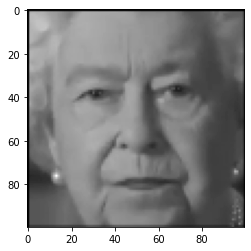

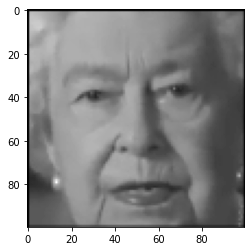

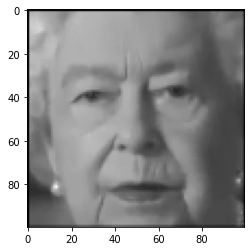

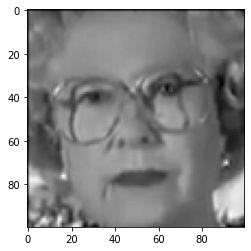

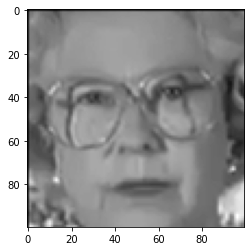

...

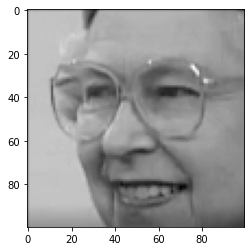

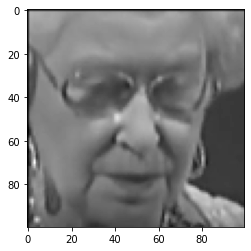

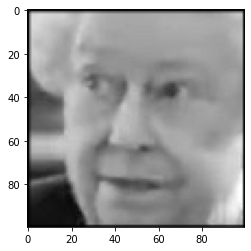

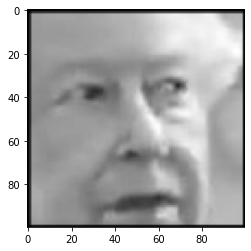

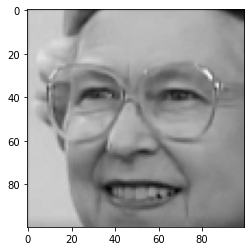

In [58]:
# boucle sur l'ensemble des photos ELizabeth
# boucle sur l'ensemble des photos
listeImages_v2 = []
cpt = 0  # initialiser un compteur qui incrémente 
for i in range(1, len(listeImages)):
    cpt = cpt + 1 # incrémentation
    image = cv2.imread("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/ElizabethII/" + listeImages[i])
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY) # convertion au niveau gris
    plt.show()
    
    faces = face_cascade.detectMultiScale(
        image,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30,30),
        flags = cv2.CASCADE_SCALE_IMAGE
    )
    
    im = image.copy()
    
    #on dessine un rectangle de couleur autour des visages détectés
    for (x, y, w, h) in faces: #dans ma variable faces
        cv2.rectangle(im, (x,y), (x+w, y+h), (0, 255, 0), 2) # un pixel a une valeur entre 0 et 255
        (x, y, w, h) = faces[0]
        center_x = x+w/2
        center_y = y+h/2
        
        crop_img = im[y:y+h, x:x+w] # découpage
        
# recalibrage des images
# toutes les images sont de taille 100x100
    im_size1 = 100
    crop_img = cv2.resize(crop_img, (im_size1,im_size1))    
    listeImages_v2.append(crop_img)
    
# enregistrer toutes les images dans le dossier training set
    nom1 = str(cpt) +'.png' # la variable prend le nom de l'image et concatène avec le .png
    # crop_img = nom de l'image
    cv2.imwrite("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/training_set/ElizabethII/"+ nom1, crop_img) 
    plt.imshow(crop_img, cmap = 'gray')

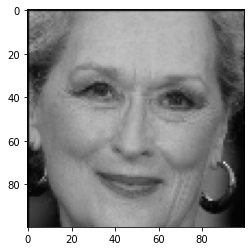

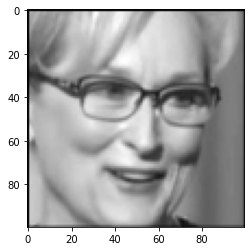

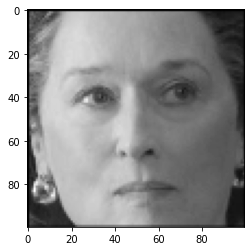

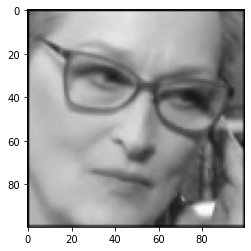

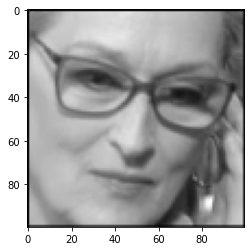

...

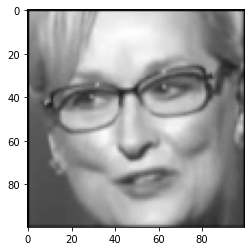

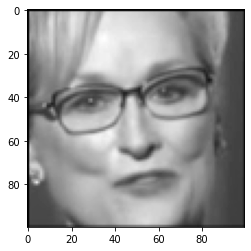

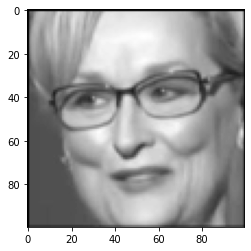

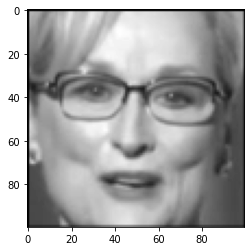

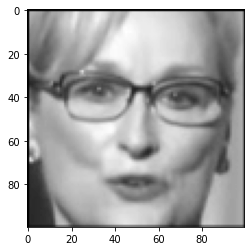

In [60]:
# boucle sur l'ensemble des photos Meryll Strip
listeImagesMeryll = []
cpt2 = 0  # initialiser un compteur qui incrémente 
for i in range(1, len(listeImagesMS)):
    cpt2 = cpt2 + 1 # incrémentation
    image2 = cv2.imread("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/meryl strip/" + listeImagesMS[i])
    image2 = cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY) # convertion au niveau gris
    plt.show()
    
    faces2 = face_cascade.detectMultiScale(
        image2,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30,30),
       flags = cv2.CASCADE_SCALE_IMAGE
    )
    
    im2 = image2.copy()
    
    #on dessine un rectangle de couleur autour des visages détectés
    for (x, y, w, h) in faces2: #dans ma variable faces
        cv2.rectangle(im2, (x,y), (x+w, y+h), (0, 255, 0), 2) # un pixel a une valeur entre 0 et 255
        (x, y, w, h) = faces2[0]
        center_x = x+w/2
        center_y = y+h/2
        crop_img2 = im2[y:y+h, x:x+w] # découpage
        
# recalibrage des images
# toutes les images sont de taille 100x100
    im_size2 = 100
    crop_img2 = cv2.resize(crop_img2, (im_size2,im_size2))    
    listeImagesMeryll.append(crop_img2)
    
# enregistrer toutes les images dans le dossier training set
    nom2 = str(cpt2) +'.png' # la variable prend le nom de l'image et concatène avec le .png
    #crop_img = nom de l'image
    cv2.imwrite("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/training_set/Meryll/"+ nom2, crop_img2) 
    plt.imshow(crop_img2, cmap = 'gray')

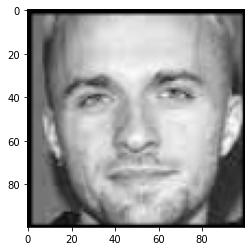

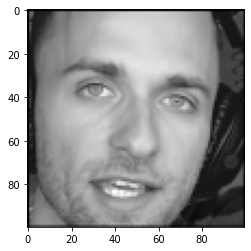

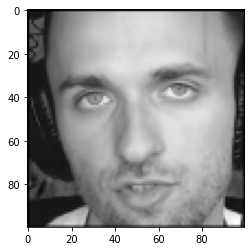

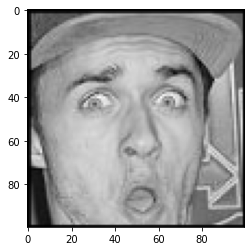

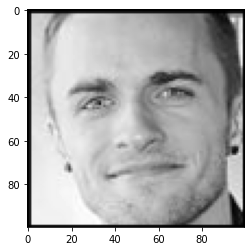

...

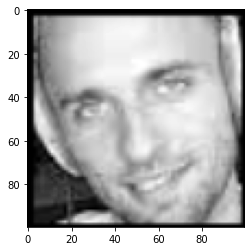

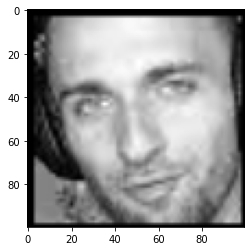

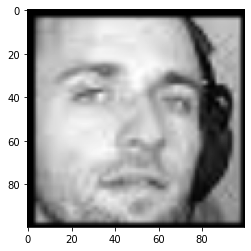

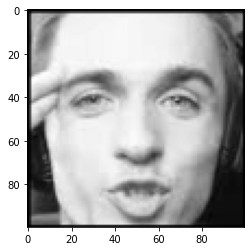

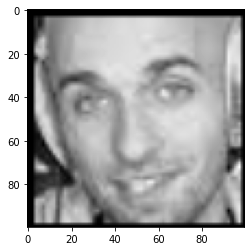

error: OpenCV(4.5.2) C:\Users\runneradmin\AppData\Local\Temp\pip-req-build-vi271kac\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


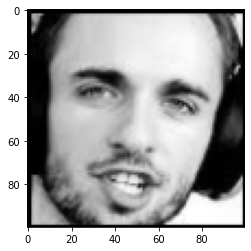

In [59]:
# boucle sur l'ensemble des photos SQUEEZIE 
listeImagesSQ = []
cpt3 = 0  # initialiser un compteur qui incrémente 
for i in range(1, len(listeImagesSqu)):
    cpt3 = cpt3 + 1 # incrémentation
    image3 = cv2.imread("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/squeezie/" + listeImagesSqu[i])
    image3 = cv2.cvtColor(image3,cv2.COLOR_BGR2GRAY) # convertion au niveau gris
    plt.show()
    
    faces3 = face_cascade.detectMultiScale(
        image3,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(30,30),
       flags = cv2.CASCADE_SCALE_IMAGE
    )
    
    im3 = image3.copy()
    
    #on dessine un rectangle de couleur autour des visages détectés
    for (x, y, w, h) in faces3: #dans ma variable faces
        cv2.rectangle(im3, (x,y), (x+w, y+h), (0, 255, 0), 2) # un pixel a une valeur entre 0 et 255
        (x, y, w, h) = faces3[0]
        center_x = x+w/2
        center_y = y+h/2
        crop_img3 = im3[y:y+h, x:x+w] # découpage
        
# recalibrage des images
# toutes les images sont de taille 100x100
    im_size3 = 100
    crop_img3 = cv2.resize(crop_img3, (im_size3,im_size3))    
    listeImagesSQ.append(crop_img3)
    
# enregistrer toutes les images dans le dossier training set
    nom3 = str(cpt3) +'.png' # la variable prend le nom de l'image et concatène avec le .png
    #crop_img = nom de l'image
    cv2.imwrite("C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/training_set/squeezie/"+ nom3, crop_img3) 
    plt.imshow(crop_img3, cmap = 'gray')

# Construction d’un réseau de neurones convolutifs avec Keras

https://moncoachdata.com/blog/visualisation-reseau-de-neurones-convolutif/

In [94]:
# import des bibliothèques nécessaires avec Keras et ses fonctions requises
import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout
from keras.preprocessing import image #une fonction de Keras qui permet de pré processer les images dans le répertoire
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

# Initialisation du modèle

In [95]:
# On initialise le modèle avec Sequential() :
model = Sequential() #On y rentre notre modèle Keras qui nous sert de conteneur

# Construction du modèle de réseau de neurones convolutif

Construction du modèle de réseau de neurones convolutif et on enchaîne des couche de conv et des couches de pooling
Nous spécifions nos couches de convolution et ajoutons MaxPooling pour réduire l’échantillonnage et Dropout pour éviter le Surapprentissage. 
On insère des couches de convolutions qui va trouver les filtres qui correspondent pour décrire notre image
La couche de Pooling est de réduire notre images pour avoir un jeu de données de plus en plus petit et concaténé 
pour pour représenter au max les features les plus petites
Nous utilisons Flatten et terminons avec une couche Dense de 3 neurones, une pour chaque classe (SQUEEZIE?? [0], MERYLL?? [1],  ELIZABETH [2]). Nous spécifions softmax en tant que fonction d’activation de notre dernière couche (ce qui est suggéré pour la classification multi-classes).

In [96]:
# Convolution
model.add(Conv2D(32, (3, 3), padding='same', input_shape = (28, 28, 3), #32 neurones (on garde des puissances de 2)
activation = 'relu'))
model.add(Conv2D(32, (3, 3), activation='relu')) #la fonction d'activation est Relu
model.add(MaxPooling2D(pool_size=(2, 2))) #une couche de MaxPooling qui prend le max du phénomène de pooling par pixels
model.add(Dropout(0.5))

# Ajout d'une deuxième couche convolutive
model.add(Conv2D(64, (3, 3), padding='same', activation = 'relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5))

# Ajout d'une troisième couche convolutive
model.add(Conv2D(64, (3, 3), padding='same', activation = 'relu'))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.5)) # antes era 0.25

# Flatten 
model.add(Flatten()) # on construit un vecteur à partir de notre matrice, envoyé à son tour à notre réseau dense

# Connexion complète
model.add(Dense(units = 512, activation = 'relu'))
model.add(Dropout(0.5)) 
model.add(Dense(units = 3, activation = 'softmax')) #softmax qui va nous donner la probabilité entre nos différentes classes

In [97]:
# Affichage du résumé de notre modèle :
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 28, 28, 32)        896       
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 26, 26, 32)        9248      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 13, 13, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 13, 13, 32)        0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 13, 13, 64)        18496     
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 11, 11, 64)        36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 5, 5, 64)         

# Compilation du Modèle

Compilation du Modèle en utilisant rmsprop comme optimiseur, categorical_crossentropy comme fonction de perte et nous spécifions accuracy comme la métrique que nous voulons suivre :

In [101]:
# Compilation du modèle
model.compile(optimizer = 'rmsprop',
                   loss = 'categorical_crossentropy', 
                   metrics = ['accuracy'])

# Utilisation de ImageDataGenerator pour lire des images à partir de répertoires

À ce stade, nous devons convertir nos images en une forme que le modèle acceptera. Pour cela, nous utilisons ImageDataGenerator. Nous l’initialisons et alimentons nos images avec .flow_from_directory. Il y a deux dossiers principaux dans le répertoire de travail, nommés training_set et test_set. Chacun d’eux a 3 sous-dossiers;

In [102]:
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
batch_size = 16 #on envoie les images 16 par 16 pour ne pas surcharger le process pour Keras
training_set = train_datagen.flow_from_directory('C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/training_set/',
                                                 target_size = (28, 28), #taille de 28 pixels par 28 pixels à l'échelle RGB (en N et B ici)
                                                 batch_size = batch_size,
                                                 class_mode = 'categorical')
test_set = test_datagen.flow_from_directory('C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/test_set/',
                                            target_size = (28, 28),
                                            batch_size = batch_size,
                                            class_mode = 'categorical')

Found 451 images belonging to 3 classes.
Found 51 images belonging to 3 classes.


Affichage de 451 images dans le training_set et 51 dans le test_set

# Utilisation du callback pour stocker les poids du meilleur modèle

Le modèle s’entraînera pendant 50 epochs mais nous utiliserons ModelCheckpoint pour stocker les poids de l’epoch la plus performante parmi ces 50 epochs. Nous allons spécifier val_accuracy comme la métrique à utiliser pour définir le meilleur modèle. Cela signifie que nous conserverons les poids de l’epoch qui obtient le meilleur résultat pour l’exactitude (accuracy) sur l’ensemble de test.

In [103]:
checkpointer = ModelCheckpoint(filepath='C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/best_weights.hdf5', 
                               monitor = 'val_accuracy',
                               verbose=1, 
                               save_best_only=True)

# Entraînement du modèle

Maintenant il est temps d’entraîner le modèle, ici nous incluons le callback à notre checkpointer.

In [104]:
# ici nous incluons le callback à notre checkpointer
history = model.fit(training_set,
                    batch_size = 100,
                    epochs = 50, #The epoch is the point where the time starts
                    callbacks=[checkpointer],
                    validation_data = test_set,
                    validation_batch_size = 50)

Epoch 1/50
29/29 [==============================] - 3s 48ms/step - loss: 1.0225 - accuracy: 0.4891 - val_loss: 1.1631 - val_accuracy: 0.1961

Epoch 00001: val_accuracy improved from -inf to 0.19608, saving model to C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME\best_weights.hdf5
Epoch 2/50
29/29 [==============================] - 1s 30ms/step - loss: 0.9737 - accuracy: 0.4769 - val_loss: 1.2023 - val_accuracy: 0.1961

Epoch 00002: val_accuracy did not improve from 0.19608
Epoch 3/50
29/29 [==============================] - 1s 30ms/step - loss: 0.9968 - accuracy: 0.4724 - val_loss: 1.6508 - val_accuracy: 0.4118

Epoch 00003: val_accuracy improved from 0.19608 to 0.41176, saving model to C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME\best_weights.hdf5
Epoch 4/50
29/29 [==============================] - 1s 29ms/step - loss: 0.9495 - accuracy: 0.5153 - val_loss: 1.3129 - val_accuracy: 0.3725

Epoch 00004: val_accuracy did not improve from 0.41176
Epo

Le modèle s’entraîne pendant 5 epochs et atteint sa meilleure performance à l’epoch 36 avec la perte et la précision ommuniquées via l'interface de programmation. Nous obtenons le message suivant : 
"Epoch 00036: val_accuracy improved from 0.64706 to 0.66667, saving model to C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME\best_weights.hdf5"
Le modèle le plus performant est enregistré dans PROJET TUT TONIC FORME.

Après cela, le modèle ne s’améliore pas pour les epochs suivantes, donc les poids de l’epoch 36sont ceux qui sont stockés – Cela signifie que nous avons maintenant un fichier hdf5 qui stocke les poids de cette époque spécifique, où la précision sur l’ensemble de test était de 66%

Comme on peut le voir, à l'époque 47 le modèle était capable d'atteindre une précision de plus de 98% et une perte de 0,0749 sur les données d'entraînement.

# Chargement de notre classificateur avec les poids du meilleur modèle

Nous nous assurerons que notre classificateur est chargé avec les meilleurs poids avec cette ligne de code :

In [120]:
model.load_weights('C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/best_weights.hdf5')

In [121]:
# Sauvegarde du modèle complet
model.save('shapes_cnn.h5')

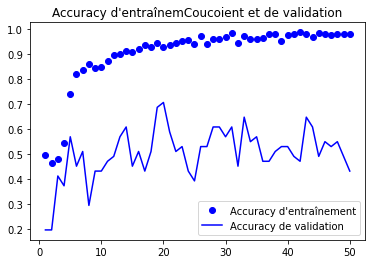

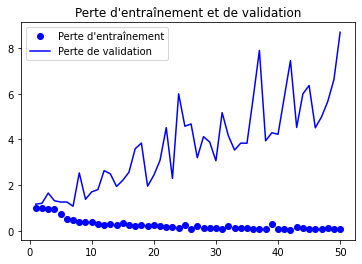

In [122]:
# Affichage des courbes de perte et de précision pendant l’entraînement
# Voyons maintenant comment notre modèle s’est comporté pendant les 50 epochs :
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label="Accuracy d'entraînement")
plt.plot(epochs, val_acc, 'b', label='Accuracy de validation')
plt.title("Accuracy d'entraînemCoucoient et de validation")
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label="Perte d'entraînement")
plt.plot(epochs, val_loss, 'b', label='Perte de validation')
plt.title("Perte d'entraînement et de validation")
plt.legend()


Nous pouvons voir qu’après l’epoch 27, le modèle semble commencer son phénomène d’overfitting. Néanmoins, nous avons gardé les résultats de l’epoch qui avait la meilleure performance.

Classes
Précisons maintenant le numéro de classe attribué à chacun de nos ensembles de chiffres, puisque c’est ainsi que le modèle produira ses prédictions :

circles : 0
squares : 1
triangles : 2

(1, 28, 28, 3)


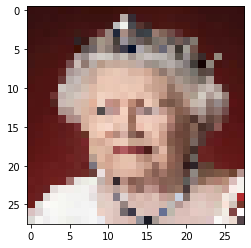

In [123]:
# Prédiction de la classe de nouvelles images INCONNUES :)
# Une fois notre modèle entraîné et stocké, nous pouvons charger une simple image
# (inconnue de notre ensemble de test) et voir comment elle est classifiée :
img_path = 'C:/Users/ahwid/Desktop/Licence Pro Big Data/PROJET TUT TONIC FORME/test_set/Meryll/NewCapture.jpg'
img = image.load_img(img_path, target_size=(28, 28))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
plt.imshow(img_tensor[0])
print(img_tensor.shape)

In [124]:
# Prédiction d’images
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])
classes = np.argmax(model.predict(images, batch_size=10), axis=-1)
print("La classe prédite est :",classes)
#La prédiction est la classe [2] qui est un ELIZABETH
## déterminer quelles sont les autres classes (circles : 0, squares : 1)

La classe prédite est : [2]


Jusqu’ici tout va bien. Nous passons maintenant à la partie la plus importante de cet article.
Ensuite, nous allons recevoir une image d’entrée – la photo d’un xxx, qui ne fait pas partie des images sur lesquelles le réseau a été entraîné.

In [113]:
# Visualisation des activations intermédiaires
# Instanciation d’un modèle à partir d’un tenseur d’entrée et d’une liste de tenseurs de sortie

In [114]:
# Extrait les sorties (outputs) des 12 couches supérieures
layer_outputs = [layer.output for layer in model.layers[:12]] 
# Crée un modèle qui retournera ces sorties (outputs), étant donné l'entrée (input) du modèle.
activation_model = models.Model(inputs=model.input, outputs=layer_outputs) 
# Lorsqu’il reçoit une image en entrée, ce modèle renvoie les valeurs des activations des couches du modèle d’origine.

Lorsqu’il reçoit une image en entrée, ce modèle renvoie les valeurs des activations des couches du modèle d’origine.

# Exécution du modèle en mode prédiction

In [116]:
# Retourne une liste de cinq tableaux NumPy : un tableau par activation de couche
activations = activation_model.predict(img_tensor)

Par exemple, voici l’activation de la première couche de convolution pour l’entrée image :

In [117]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 28, 28, 32)


Il s’agit d’une carte de features 28 × 28 avec 32 canaux. Essayons de tracer le quatrième canal de l’activation de la première couche du modèle d’origine :

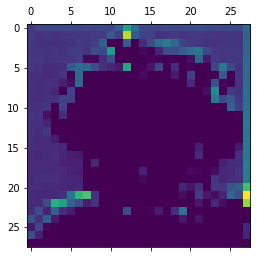

In [118]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

Avant même d’essayer d’interpréter cette activation, traçons plutôt toutes les activations de cette même image à travers chaque couche.

# Visualisation de chaque canal dans chaque activation intermédiaire

<ipython-input-119-44ba61ef8b44>:18: RuntimeWarning: invalid value encountered in true_divide
  channel_image /= channel_image.std()


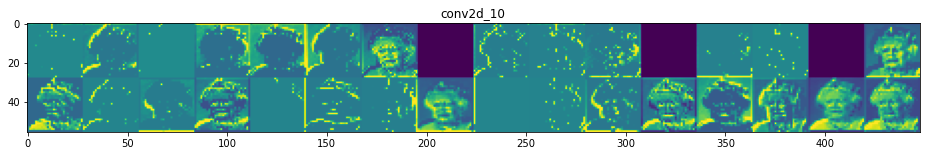

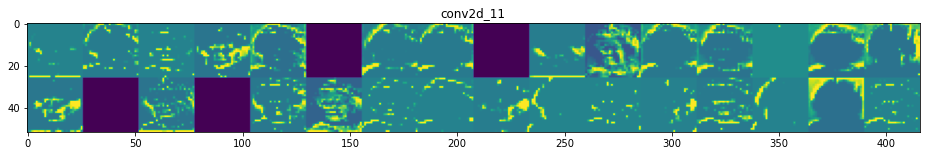

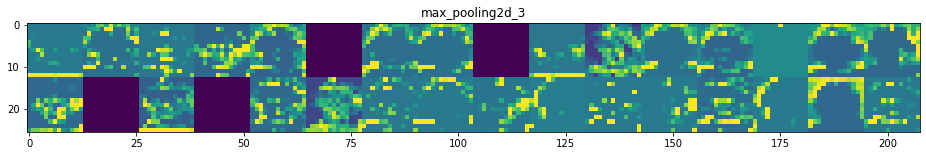

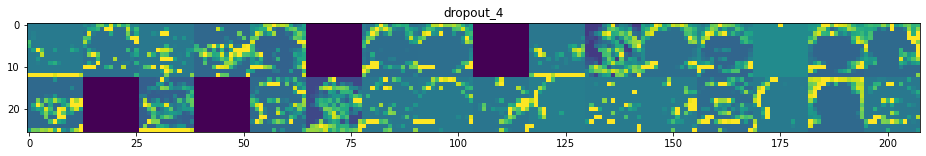

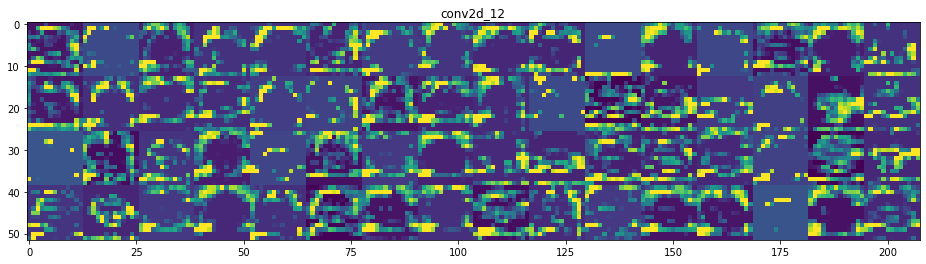

...

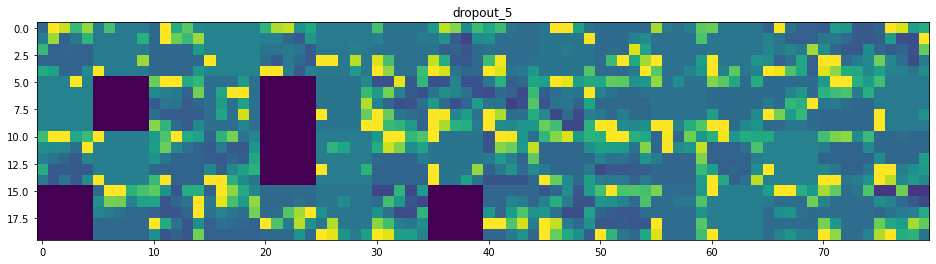

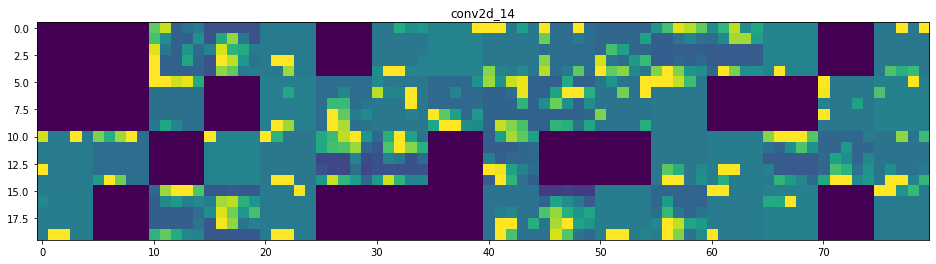

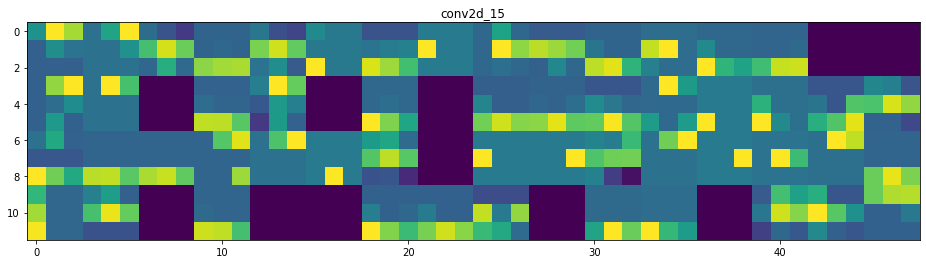

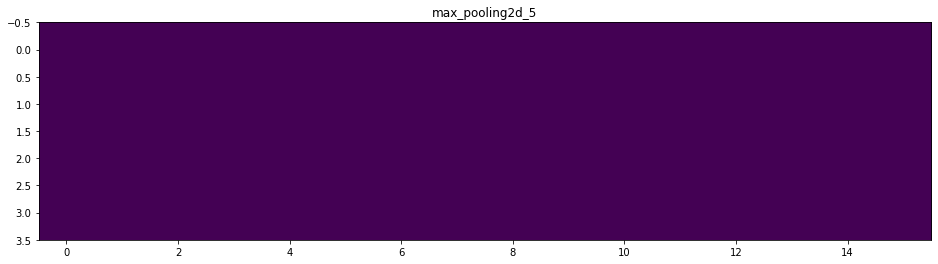

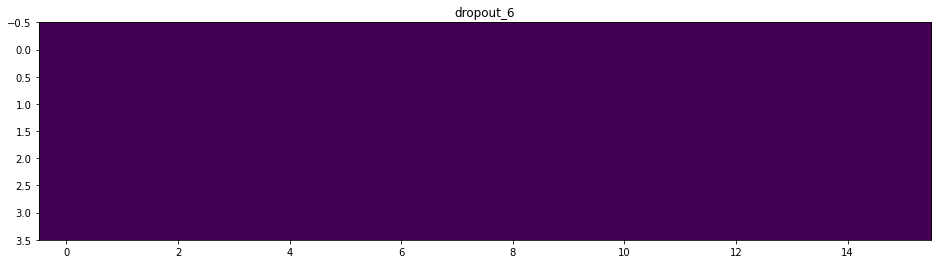

In [119]:
layer_names = []
for layer in model.layers[:12]:
    layer_names.append(layer.name) # Noms des couches, afin que vous puissiez les intégrer à votre graphique

images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations): # Affiche les cartes des features
    n_features = layer_activation.shape[-1] # Nombre de features dans la carte des features
    size = layer_activation.shape[1] # La carte des features a la forme/dimension suivante : (1, size, size, n_features).
    n_cols = n_features // images_per_row # Classer les canaux d'activation dans cette matrice
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Classer chaque filtre dans une grande grille horizontale
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-traitement de la feature pour la rendre visuellement acceptable.
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Affiche la grille
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

On peut dire que la première couche retient la forme complète de la reine Elizabeth II, bien que plusieurs filtres ne soient pas activés et soient laissés en blanc. À ce stade, les activations retiennent presque toutes les informations présentes dans l’image initiale.
Plus nous descendons dans les couches, plus les activations deviennent abstraites et moins interprétables visuellement. Elles commencent à encoder des concepts de plus haut niveau tels que les bordures simples, les coins et les angles. Les présentations supérieures véhiculent de moins en moins d’informations sur le contenu visuel de l’image, et de plus en plus d’informations liées à la classe de l’image.
Comme nous l’avons mentionné plus haut, la structure du modèle est excessivement complexe, au point que nous pouvons voir nos dernières couches ne pas s’activer du tout, il n’y a plus rien à apprendre à ce stade.
Nous avons donc visualisé comment un réseau de neurones convolutif trouve des modèles dans certaines figures de base et comment il transporte l’information d’une couche à l’autre.

https://ichi.pro/fr/algorithme-de-detection-de-masque-facial-utilisant-le-reseau-neuronal-convolutif-ai-vision-par-ordinateur-24122843747134

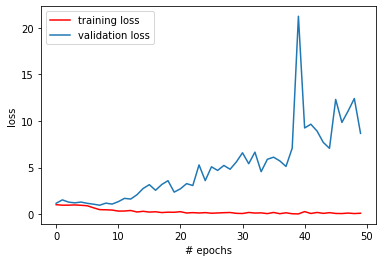

In [84]:
from matplotlib import pyplot as plt
plt.plot(history.history['loss'], 'r', label='training loss')
plt.plot(history.history['val_loss'],label='validation loss')
plt.xlabel('# epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

La valeur de la perte pour chaque époque de formation est tracée dans le graphique ci-dessus. A partir de l'époque 10 environ, la perte augmente sur l'ensemble d'apprentissage, mais pas sur l'ensemble de validation. Ici, le modèle ne s'adapte pas à nos données d'entraînement, bien au contraire, surtout au niveau de l'époque 40.

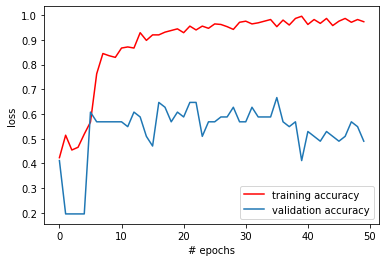

In [85]:
#le modèle parvient toujours à obtenir un score de précision 
#impressionnant sur les données de validation sans ces modifications en place.
plt.plot(history.history['accuracy'], 'r', label='training accuracy')
plt.plot(history.history['val_accuracy'],label='validation accuracy')
plt.xlabel('# epochs')
plt.ylabel('loss')
plt.legend()
plt.show()